In [356]:
import pandas as pd

In [357]:
data = pd.read_csv("../data/curated/Complete Data.csv")
coast = pd.read_csv("../data/curated/vic_beach_proximity.csv")
schools = pd.read_csv("../data/curated/schools_by_SAL.csv")
tourism = pd.read_csv("../data/curated/victoria_gdp_tourism.csv")

In [358]:
data[data['SAL_CODE'] == 21640][['Tot_P_P', 'year','SAL_CODE']]

,Tot_P_P,year,SAL_CODE
1170,47265.977244,2016,21640
1171,48800.981796,2017,21640
1172,50335.986347,2018,21640
1173,51870.990898,2019,21640
1174,53405.995449,2020,21640
1175,54941.000000,2021,21640
1176,56476.004551,2022,21640
1177,58011.009102,2023,21640
1178,59546.013653,2024,21640
1179,61081.018204,2025,21640


In [359]:
data[data['SAL_CODE'] == 22399][['Tot_P_P', 'year','SAL_CODE']]

,Tot_P_P,year,SAL_CODE
832,13605.0,2016,22399
833,13615.0,2017,22399
834,13625.0,2018,22399
835,13635.0,2019,22399
836,13645.0,2020,22399
837,13655.0,2021,22399
838,13665.0,2022,22399
839,13675.0,2023,22399
840,13685.0,2024,22399
841,13695.0,2025,22399


In [360]:
# get years from 2016-2023
data_train = data[data['year'] != 2024]
data_train = pd.merge(data_train, tourism, on='year', how='inner')

In [361]:
to_exclude = pd.read_csv('../data/landing/filtered_sal_codes.csv')

to_exclude = list(to_exclude['SAL_CODE'])

In [362]:
data_train.shape

(6792, 66)

In [363]:
missing_values = data_train.isnull().sum()
pd.set_option('display.max_rows', 70)
missing_values

Suburb Cluster                              0
SAL_suburb                                  0
SAL_CODE                                    0
Suburb Group                                0
AREASQKM21                                  0
station_count_in_suburb                     0
closest_stations                            0
closest_station_1_STOP_NAME                 0
closest_station_1_LATITUDE                  0
closest_station_1_LONGITUDE                 0
closest_station_2_STOP_NAME                 0
closest_station_2_LATITUDE                  0
closest_station_2_LONGITUDE                 0
suburb_centre_latitude                      0
suburb_centre_longitude                     0
distance_to_CBD                             0
time_to_CBD                                 0
distance_to_station                         0
time_to_station                             0
median_score                                0
average_price                               0
proximity_to_beach                

In [364]:
# Get counts per year
year_counts = data_train['year'].value_counts().sort_index()

# Print the counts
print(year_counts)

2016    566
2017    566
2018    566
2019    566
2020    566
2021    566
2022    566
2023    566
2025    566
2026    566
2027    566
2028    566
Name: year, dtype: int64


In [365]:
# also exclude any airport
data_train = data_train[~data_train['SAL_suburb'].str.contains('Airport')]

data_train = data_train[~data_train['SAL_CODE'].isin(to_exclude)]

data_train = data_train[~data_train['SAL_suburb'].str.contains("Ravenhall")]

# Get counts per year
year_counts = data_train['year'].value_counts().sort_index()

# Print the counts
print(year_counts)

2016    429
2017    429
2018    429
2019    429
2020    429
2021    429
2022    429
2023    429
2025    429
2026    429
2027    429
2028    429
Name: year, dtype: int64


In [366]:
missing_values = data_train.isnull().sum()
pd.set_option('display.max_rows', 70)
missing_values

Suburb Cluster                              0
SAL_suburb                                  0
SAL_CODE                                    0
Suburb Group                                0
AREASQKM21                                  0
station_count_in_suburb                     0
closest_stations                            0
closest_station_1_STOP_NAME                 0
closest_station_1_LATITUDE                  0
closest_station_1_LONGITUDE                 0
closest_station_2_STOP_NAME                 0
closest_station_2_LATITUDE                  0
closest_station_2_LONGITUDE                 0
suburb_centre_latitude                      0
suburb_centre_longitude                     0
distance_to_CBD                             0
time_to_CBD                                 0
distance_to_station                         0
time_to_station                             0
median_score                                0
average_price                               0
proximity_to_beach                

In [367]:
data_train.shape

(5148, 66)

In [368]:
(3424 - 2912) / 4

128.0

In [369]:
data_train.columns

Index(['Suburb Cluster', 'SAL_suburb', 'SAL_CODE', 'Suburb Group',
       'AREASQKM21', 'station_count_in_suburb', 'closest_stations',
       'closest_station_1_STOP_NAME', 'closest_station_1_LATITUDE',
       'closest_station_1_LONGITUDE', 'closest_station_2_STOP_NAME',
       'closest_station_2_LATITUDE', 'closest_station_2_LONGITUDE',
       'suburb_centre_latitude', 'suburb_centre_longitude', 'distance_to_CBD',
       'time_to_CBD', 'distance_to_station', 'time_to_station', 'median_score',
       'average_price', 'proximity_to_beach', 'Cemeteries',
       'Civic squares and promenades', 'Conservation reserves',
       'Government schools', 'Natural and semi-natural open space',
       'Non-government schools', 'Parks and gardens',
       'Public housing reserves', 'Recreation corridor',
       'Services and utilities reserves',
       'Sportsfields and organised recreation', 'Tertiary institutions',
       'Transport reservations', 'year', 'A Crimes against the person',
       'Ave

In [370]:
cols = ['distance_to_CBD', 'time_to_CBD','distance_to_station', 'time_to_station', 'Cemeteries',
       'Civic squares and promenades', 'Conservation reserves',
       'Government schools', 'Natural and semi-natural open space',
       'Non-government schools', 'Parks and gardens',
       'Public housing reserves', 'Recreation corridor',
       'Services and utilities reserves',
       'Sportsfields and organised recreation', 'Tertiary institutions',
       'Transport reservations', 'year', 'A Crimes against the person',
       'Average_household_size', 'Average_num_psns_per_bedroom',
       'B Property and deception offences', 'C Drug offences',
       'D Public order and security offences', 'E Justice procedures offences',
       'F Other offences', 'Median_age_persons', 'Median_tot_fam_inc_weekly',
       'Median_tot_hhd_inc_weekly', 'Median_tot_prsnl_inc_weekly', 'Tot_P_P',
        'average_quarterly_count', 'average_weekly_rent',
        'commercial', 'education', 'food_establishments',
       'healthcare', 'industrial', 'public_transport', 'recreation',
       'residential', 'shopping', 'inflation',"SAL_CODE", "median_score", 'average_price',"proximity_to_beach", 'gdp_impact']

data_train = data_train[cols]

In [371]:
# Get counts per year
year_counts = data_train['year'].value_counts().sort_index()

# Print the counts
print(year_counts)

2016    429
2017    429
2018    429
2019    429
2020    429
2021    429
2022    429
2023    429
2025    429
2026    429
2027    429
2028    429
Name: year, dtype: int64


In [372]:
missing_values = data_train.isnull().sum()
pd.set_option('display.max_rows', 70)
missing_values

distance_to_CBD                             0
time_to_CBD                                 0
distance_to_station                         0
time_to_station                             0
Cemeteries                                  0
Civic squares and promenades                0
Conservation reserves                       0
Government schools                          0
Natural and semi-natural open space         0
Non-government schools                      0
Parks and gardens                           0
Public housing reserves                     0
Recreation corridor                         0
Services and utilities reserves             0
Sportsfields and organised recreation       0
Tertiary institutions                       0
Transport reservations                      0
year                                        0
A Crimes against the person                 0
Average_household_size                      0
Average_num_psns_per_bedroom                0
B Property and deception offences 

In [373]:
years_interest = list(range(2016, 2030))
interest_rates = [
    1.75,  # 2016
    1.50,  # 2017
    1.50,  # 2018
    1.50,  # 2019
    0.25,  # 2020 (COVID-19 impact, very low rates)
    0.10,  # 2021 (near-zero rates)
    0.35,  # 2022 (start of increase)
    3.10,  # 2023 (rise due to inflation concerns)
    4.00,  # 2024 (projection)
    3.75,  # 2025 (projection)
    3.50,  # 2026 (projection)
    3.25,  # 2027 (projection)
    3.00,  # 2028 (projection)
    2.75   # 2029 (projection)
]

# Creating a DataFrame
interest_rate_table = pd.DataFrame({
    "Year": years_interest,
    "Projected Interest Rate (%)": interest_rates
})

# create df with years and gdp growth rate
gdp_df = pd.DataFrame({
    'year': range(2016, 2030),
    'interest_rate': interest_rates
})

# Merge the GDP growth rate data with the main dataframe on the 'year' column
data_train = pd.merge(data_train, gdp_df, on='year', how='left')

In [374]:
import pandas as pd

# Assuming your DataFrame is called df
# First, ensure that your DataFrame is sorted by 'year'
df = data_train
df = df.sort_values('year')

# Convert 'inflation' rates from percentages to decimals
df['inflation_decimal'] = df['inflation'] / 100

# Create a DataFrame containing all years from 2016 to the maximum year in your data
years = pd.DataFrame({'year': range(2016, df['year'].max() + 1)})

# Merge with the inflation data to ensure all years are included
inflation_data = pd.merge(years, df[['year', 'inflation_decimal']].drop_duplicates(), on='year', how='left')

# Forward-fill any missing inflation rates (if any years are missing)
inflation_data['inflation_decimal'] = inflation_data['inflation_decimal'].fillna(method='ffill')

# Calculate the cumulative inflation factor from 2016 to each year
inflation_data['cumulative_inflation_factor'] = (1 + inflation_data['inflation_decimal']).cumprod()

# Create a dictionary to map years to cumulative inflation factors
cumulative_inflation_dict = inflation_data.set_index('year')['cumulative_inflation_factor'].to_dict()

# Map the cumulative inflation factors back to the original DataFrame
df['cumulative_inflation_factor'] = df['year'].map(cumulative_inflation_dict)


# Update the 'inflation' column to reflect the cumulative effect from 2016
df['inflation'] = df['cumulative_inflation_factor']

# Drop the temporary columns if you no longer need them
df = df.drop(columns=['inflation_decimal', 'cumulative_inflation_factor'])


In [375]:
import numpy as np

In [376]:
import matplotlib.pyplot as plt
import seaborn as sns

In [377]:
# combine inflation and gdp growth rate per year:
# Merge the GDP growth rate data with the main dataframe on the 'year' column
inflation_data = pd.merge(inflation_data, gdp_df, on='year', how='left')
inflation_data

,year,inflation_decimal,cumulative_inflation_factor,interest_rate
0,2016,0.013,1.013000,1.75
1,2017,0.021,1.034273,1.50
2,2018,0.019,1.053924,1.50
3,2019,0.013,1.067625,1.50
4,2020,0.022,1.091113,0.25
5,2021,0.011,1.103115,0.10
6,2022,0.051,1.159374,0.35
7,2023,0.070,1.240530,3.10
8,2024,0.070,1.327367,4.00
9,2025,0.030,1.367188,3.75


In [378]:
# inflation affected columns
inflation_affected_cols = ['average_weekly_rent', 'Median_tot_fam_inc_weekly', 'Median_tot_hhd_inc_weekly', 'Median_tot_prsnl_inc_weekly', 'gdp_impact']

# Apply inflation adjustment to the affected columns
for col in inflation_affected_cols:
    df[col + '/inflation'] = df[col] / df['inflation']

    df.drop(columns=[col], inplace=True)

In [379]:

df['gdp_cbd/inflation/beach'] = df['gdp_impact/inflation'] *  df['proximity_to_beach']
df['gdp_cbd/inflation/cbd'] = df['gdp_impact/inflation'] *  df['distance_to_CBD']

In [380]:
df.drop(columns=['inflation'], inplace=True)

In [381]:
# divide by average_household_size to get 'per person' rent
df['average_weekly_rent/inflation/household_size'] = df['average_weekly_rent/inflation'] / (df['Average_household_size'] + 0.01)
df.drop(columns=['average_weekly_rent/inflation'], inplace=True)

In [382]:
import numpy as np

In [383]:
df['Tot_P_P'].min()

817.0

In [384]:
df['SAL_CODE'][df['Tot_P_P'] == df['Tot_P_P'].min()]

47    21393
Name: SAL_CODE, dtype: int64

In [385]:
df[df['SAL_CODE'] == 21640][['Tot_P_P', 'year','SAL_CODE']]

,Tot_P_P,year,SAL_CODE


In [386]:
# get crime rate per person
crime_cols = ['A Crimes against the person', 'B Property and deception offences', 'C Drug offences', 'D Public order and security offences', 'E Justice procedures offences', 'F Other offences']

for col in crime_cols:
    df[col + '/per_person'] = df[col] / (df['Tot_P_P'] + 0.01)

    df.drop(columns=[col], inplace=True)

In [387]:
# log data for every column but average weekly rent
for col in df.columns:
    if col not in ['average_weekly_rent/inflation/household_size', 'SAL_CODE', 'year', 'interest_rate']:
        df[col] = df[col].apply(lambda x: np.log(x + 1))

In [388]:
target = 'average_weekly_rent/inflation/household_size'

In [389]:
import matplotlib.pyplot as plt
import seaborn as sns

In [390]:
missing_values = df.isnull().sum()
pd.set_option('display.max_rows', 70)
missing_values

distance_to_CBD                                       0
time_to_CBD                                           0
distance_to_station                                   0
time_to_station                                       0
Cemeteries                                            0
Civic squares and promenades                          0
Conservation reserves                                 0
Government schools                                    0
Natural and semi-natural open space                   0
Non-government schools                                0
Parks and gardens                                     0
Public housing reserves                               0
Recreation corridor                                   0
Services and utilities reserves                       0
Sportsfields and organised recreation                 0
Tertiary institutions                                 0
Transport reservations                                0
year                                            

In [391]:
df.dropna(inplace=True)

In [392]:
# remove Nan for target variable
df = df[~df[target].isna()]

In [393]:
df.shape

(3432, 50)

In [394]:
# Get counts per year
year_counts = df['year'].value_counts().sort_index()

# Print the counts
print(year_counts)

2016    429
2017    429
2018    429
2019    429
2020    429
2021    429
2022    429
2023    429
Name: year, dtype: int64


In [395]:
max_value = df[target].max()
min_value = df[target].min()

print(f"Maximum value: {max_value}")
print(f"Minimum value: {min_value}")

# remove non numbers (infinity)
df = df[np.isfinite(df[target])]
df = df[~df[target].isna()]

Maximum value: 283.80686683409175
Minimum value: 85.14646522432103


In [396]:
# Get counts per year
year_counts = df['year'].value_counts().sort_index()

# Print the counts
print(year_counts)

2016    429
2017    429
2018    429
2019    429
2020    429
2021    429
2022    429
2023    429
Name: year, dtype: int64


In [397]:
df.to_csv("../data/curated/procesed_data.csv", index=False)

In [398]:
df_dropped = df[df['year'].isin([2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023])]

In [399]:
df_dropped = df_dropped.drop(columns=['SAL_CODE', 'year', 'average_quarterly_count'])

In [400]:
df_dropped.shape

(3432, 47)

In [401]:
df_dropped = df_dropped.drop("Average_household_size", axis=1)

In [402]:
from sklearn.model_selection import train_test_split

X = df_dropped.drop(columns=[target])
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(df_dropped.drop(columns=[target]), df[target], test_size=0.2, random_state=42)

In [403]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform both training and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the Linear Regression model
lr_model = LinearRegression()

# Train the model on the scaled training data
lr_model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test set
y_pred_lr = lr_model.predict(X_test_scaled)

# Evaluate the model
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

print(f"Linear Regression Mean Squared Error: {mse_lr}")
print(f"Linear Regression R^2 Score: {r2_lr}")

Linear Regression Mean Squared Error: 201.5368390310552
Linear Regression R^2 Score: 0.8292298186285916


In [404]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the StandardScaler
scaler = StandardScaler()



# Initialize the Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Train the model on the scaled training data
rf_model.fit(X_train, y_train)

# Make predictions on the scaled test set
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest Mean Squared Error: {mse_rf}")
print(f"Random Forest R^2 Score: {r2_rf}")

Random Forest Mean Squared Error: 40.25197065218269
Random Forest R^2 Score: 0.9658929039381696


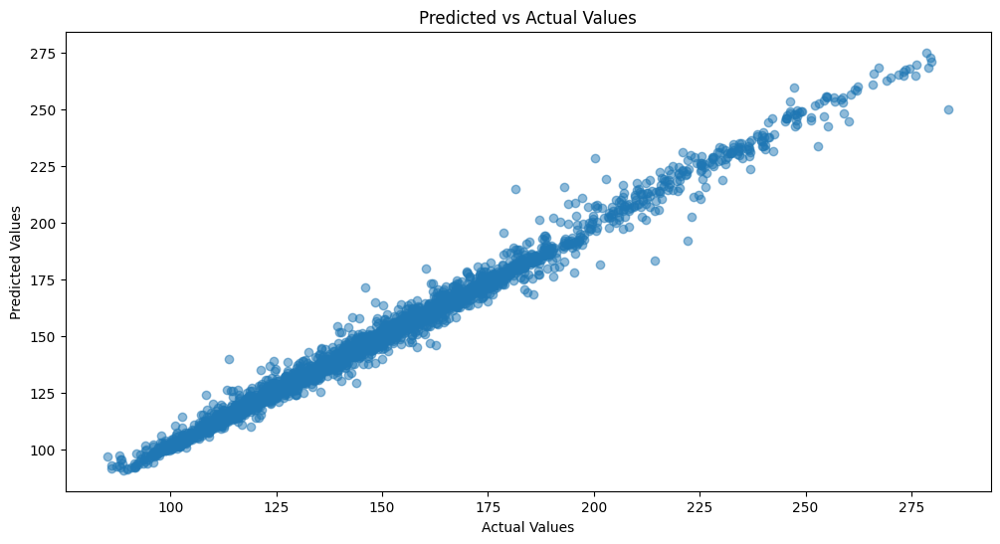

In [405]:
# Plot predicted vs actual values
plt.figure(figsize=(12, 6))
plt.scatter(y, rf_model.predict(X), alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Predicted vs Actual Values')
plt.show()

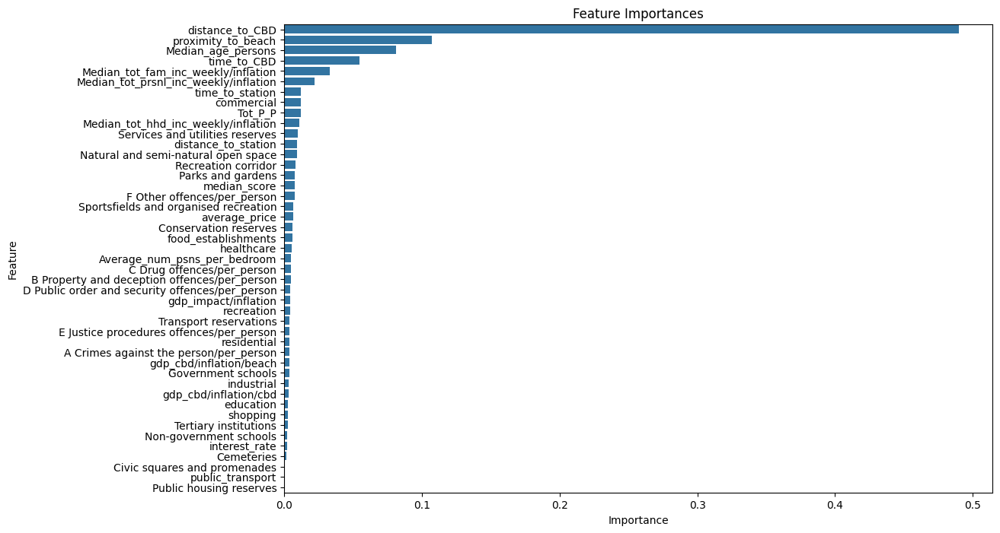

In [406]:
import seaborn as sns

import matplotlib.pyplot as plt

# Get feature importances from the RandomForest model
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=importances[indices], y=X_train.columns[indices])
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [407]:
from sklearn.model_selection import train_test_split
# Define features (X) and target (y)
X = df.drop(columns=[target, 'SAL_CODE'])
y = df[target]
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

# Add a constant to the features (X) for the intercept term
X = sm.add_constant(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4269)



# drop year
X_train.drop(columns=['year'], inplace=True)
X_test.drop(columns=['year'], inplace=True)


# Initialize and train the OLS model
model = sm.OLS(y_train, X_train).fit()
    
# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")
print(model.summary())


Mean Squared Error: 184.79695130711352
R^2 Score: 0.8387080286273673
                                         OLS Regression Results                                         
Dep. Variable:     average_weekly_rent/inflation/household_size   R-squared:                       0.842
Model:                                                      OLS   Adj. R-squared:                  0.839
Method:                                           Least Squares   F-statistic:                     305.8
Date:                                          Wed, 02 Oct 2024   Prob (F-statistic):               0.00
Time:                                                  00:03:10   Log-Likelihood:                -10952.
No. Observations:                                          2745   AIC:                         2.200e+04
Df Residuals:                                              2697   BIC:                         2.228e+04
Df Model:                                                    47                            

In [408]:
import pandas as pd

import statsmodels.api as sm

def stepwise_selection(X, y, 
                       initial_list=[], 
                       threshold_in=0.01, 
                       threshold_out=0.05, 
                       verbose=True):
    """ Perform a forward-backward feature selection 
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    """
    included = list(initial_list)
    while True:
        changed=False
        # forward step
        excluded = list(set(X.columns) - set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included + [new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max() 
        if worst_pval > threshold_out:
            changed=True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included

# Perform stepwise selection
result = stepwise_selection(X_train, y_train)

print('Selected features:')
print(result)

Add  const                          with p-value 0.0
Add  Average_household_size         with p-value 0.0
Add  Median_tot_fam_inc_weekly/inflation with p-value 1.32524e-312


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' i

Add  time_to_CBD                    with p-value 4.07122e-148
Add  Median_age_persons             with p-value 1.94878e-32


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  gdp_cbd/inflation/beach        with p-value 1.02197e-24
Add  time_to_station                with p-value 3.28264e-22


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  food_establishments            with p-value 7.46175e-18
Add  interest_rate                  with p-value 1.25778e-17


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  average_quarterly_count        with p-value 3.54979e-16


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  Natural and semi-natural open space with p-value 8.56659e-14
Add  A Crimes against the person/per_person with p-value 1.06677e-14


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  Civic squares and promenades   with p-value 2.51984e-10
Add  Services and utilities reserves with p-value 1.44529e-07


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  proximity_to_beach             with p-value 1.09822e-06
Add  industrial                     with p-value 8.57207e-07


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  Public housing reserves        with p-value 1.98245e-06


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  median_score                   with p-value 2.19116e-08


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  gdp_impact/inflation           with p-value 0.000469673


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  D Public order and security offences/per_person with p-value 0.0027083


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  F Other offences/per_person    with p-value 0.00337186


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  gdp_cbd/inflation/cbd          with p-value 0.0045327


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  distance_to_CBD                with p-value 7.56911e-06


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  Tot_P_P                        with p-value 0.00070927


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  education                      with p-value 0.000125649


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  Recreation corridor            with p-value 0.000565103


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  Transport reservations         with p-value 0.00190305
Add  recreation                     with p-value 0.00259969


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Add  public_transport               with p-value 0.00196825
Add  Conservation reserves          with p-value 0.00912031


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/2718055390.py:26: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


Selected features:
['const', 'Average_household_size', 'Median_tot_fam_inc_weekly/inflation', 'time_to_CBD', 'Median_age_persons', 'gdp_cbd/inflation/beach', 'time_to_station', 'food_establishments', 'interest_rate', 'average_quarterly_count', 'Natural and semi-natural open space', 'A Crimes against the person/per_person', 'Civic squares and promenades', 'Services and utilities reserves', 'proximity_to_beach', 'industrial', 'Public housing reserves', 'median_score', 'gdp_impact/inflation', 'D Public order and security offences/per_person', 'F Other offences/per_person', 'gdp_cbd/inflation/cbd', 'distance_to_CBD', 'Tot_P_P', 'education', 'Recreation corridor', 'Transport reservations', 'recreation', 'public_transport', 'Conservation reserves']


In [409]:
# Use the selected features from stepwise selection
selected_features = result

# Define the new training and testing sets based on the selected features
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

# Initialize and train the Linear Regression model
lr_model_selected = LinearRegression()
lr_model_selected.fit(X_train_selected, y_train)

# Make predictions on the test set
y_pred_selected = lr_model_selected.predict(X_test_selected)

# Evaluate the model
mse_selected = mean_squared_error(y_test, y_pred_selected)
r2_selected = r2_score(y_test, y_pred_selected)

print(f"Linear Regression with Selected Features Mean Squared Error: {mse_selected}")
print(f"Linear Regression with Selected Features R^2 Score: {r2_selected}")

Linear Regression with Selected Features Mean Squared Error: 188.33839818544416
Linear Regression with Selected Features R^2 Score: 0.835617030943276


In [410]:
selected_features

['const',
 'Average_household_size',
 'Median_tot_fam_inc_weekly/inflation',
 'time_to_CBD',
 'Median_age_persons',
 'gdp_cbd/inflation/beach',
 'time_to_station',
 'food_establishments',
 'interest_rate',
 'average_quarterly_count',
 'Natural and semi-natural open space',
 'A Crimes against the person/per_person',
 'Civic squares and promenades',
 'Services and utilities reserves',
 'proximity_to_beach',
 'industrial',
 'Public housing reserves',
 'median_score',
 'gdp_impact/inflation',
 'D Public order and security offences/per_person',
 'F Other offences/per_person',
 'gdp_cbd/inflation/cbd',
 'distance_to_CBD',
 'Tot_P_P',
 'education',
 'Recreation corridor',
 'Transport reservations',
 'recreation',
 'public_transport',
 'Conservation reserves']

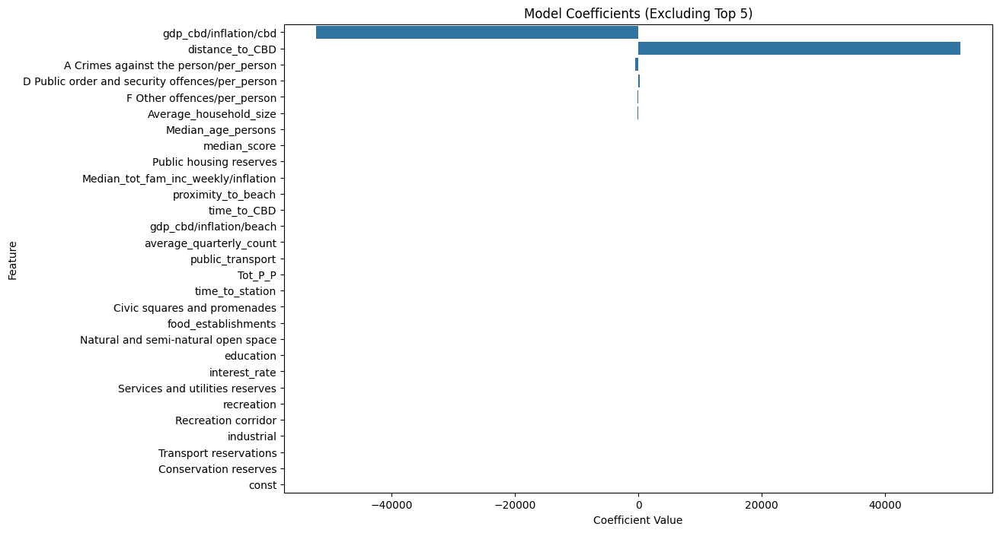

In [411]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the coefficients from the model
coefficients = lr_model_selected.coef_
coefficients = pd.Series(coefficients, index=X_train_selected.columns)

# Sort the coefficients by their absolute values
coefficients = coefficients.sort_values(key=abs, ascending=False)

# Remove the top 5 coefficients
coefficients = coefficients[1:]

# Plot the remaining coefficients
plt.figure(figsize=(12, 8))
sns.barplot(x=coefficients.values, y=coefficients.index)
plt.title('Model Coefficients (Excluding Top 5)')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.show()

In [412]:
# top ten coeffs and name
# Get the coefficients from the model
coefficients = model.params

# Get the top 10 coefficient
top_10_coeffs = coefficients.nlargest(20)



# Print the top 10 coefficients and their names
print(top_10_coeffs)

gdp_impact/inflation                               63303.176402
distance_to_CBD                                    63287.740586
C Drug offences/per_person                           441.739138
D Public order and security offences/per_person      273.438043
const                                                107.404197
Median_age_persons                                    22.091959
median_score                                          21.473208
Median_tot_fam_inc_weekly/inflation                   20.111551
Public housing reserves                               18.798329
Median_tot_hhd_inc_weekly/inflation                   15.966270
proximity_to_beach                                    11.819512
public_transport                                       3.718963
Tot_P_P                                                3.119968
time_to_station                                        2.785451
Civic squares and promenades                           2.150876
interest_rate                           

In [413]:
# Initialize and train the Random Forest model
from sklearn.ensemble import RandomForestRegressor


rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest Mean Squared Error: {mse_rf}")
print(f"Random Forest R^2 Score: {r2_rf}")

Random Forest Mean Squared Error: 35.91592843593683
Random Forest R^2 Score: 0.9686523459389578


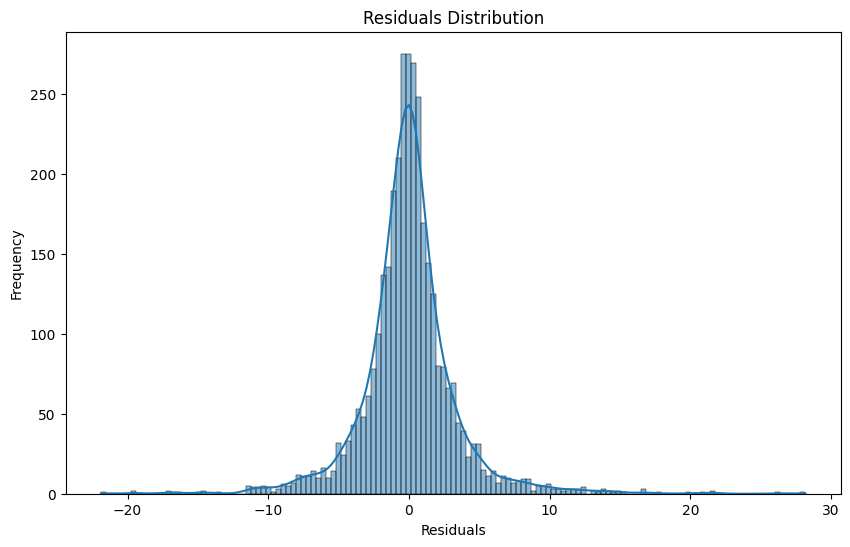

In [414]:
# plot residuals
# Calculate residuals
# Calculate residuals for the whole DataFrame
y_pred = rf_model.predict(X.drop(columns=['year']))
residuals = y - y_pred

# Plot residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

In [415]:
X_train.columns


X_train.drop(columns=['average_quarterly_count'], inplace=True)
X_test.drop(columns=['average_quarterly_count'], inplace=True)

In [416]:
import geopandas as gpd
import pandas as pd

In [417]:
def generate_plot(ax, df, col, sal_code = "SAL_CODE", name=""):

    sal_code = gpd.read_file("../data/landing/SAL_data/SAL_2021_AUST_GDA2020.shp")

    # Drop non-integer SAL_CODE21 values
    sal_code = sal_code[sal_code['SAL_CODE21'].apply(lambda x: str(x).isdigit())]
    sal_code["SAL_CODE21"] = sal_code["SAL_CODE21"].astype(int)
    
    merged_df = sal_code.merge(df, left_on='SAL_CODE21', right_on='SAL_CODE', how='inner')
    merged_df.plot(column=col, ax=ax, legend=True, cmap='coolwarm')

    

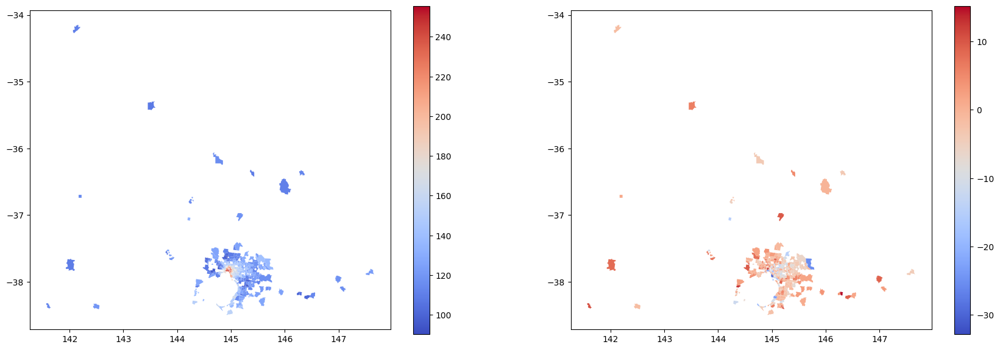

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/578931199.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


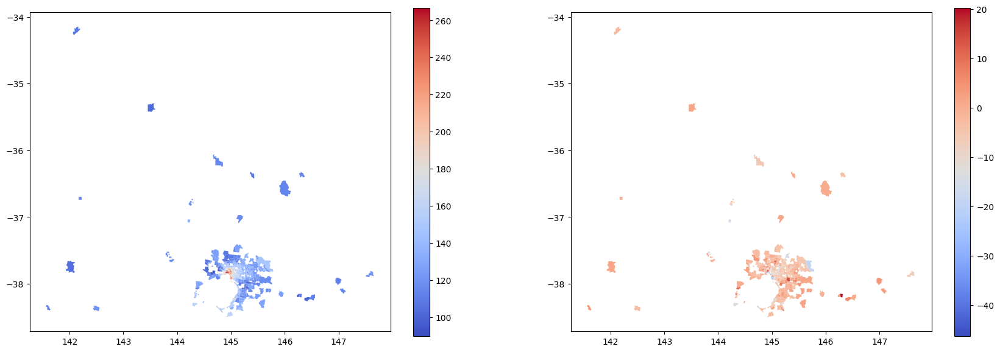

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/578931199.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


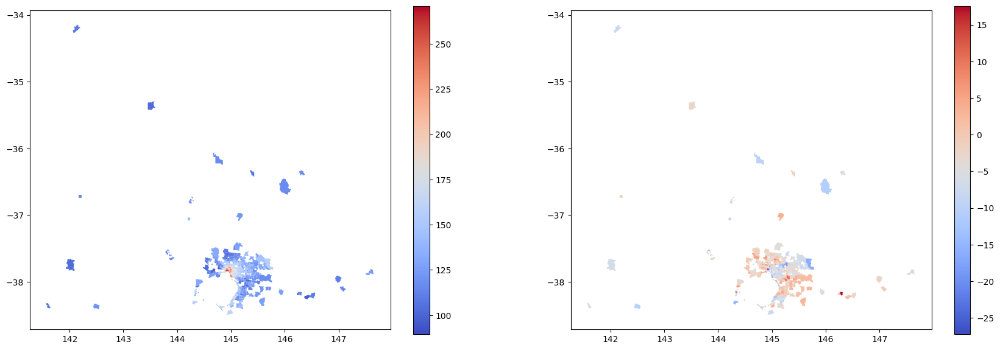

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/578931199.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


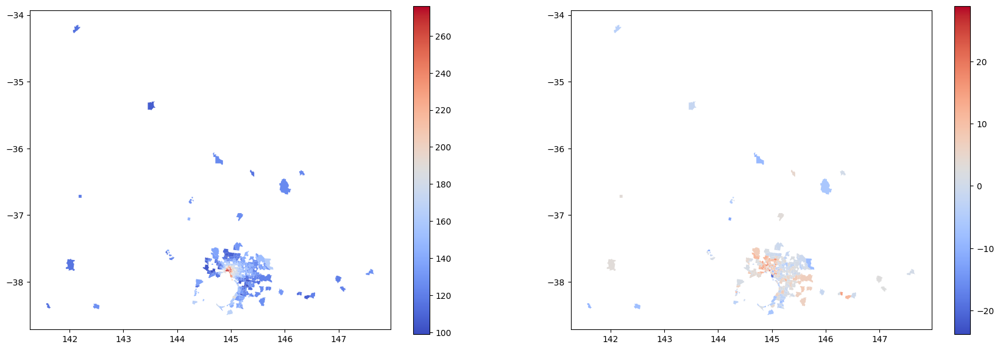

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/578931199.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


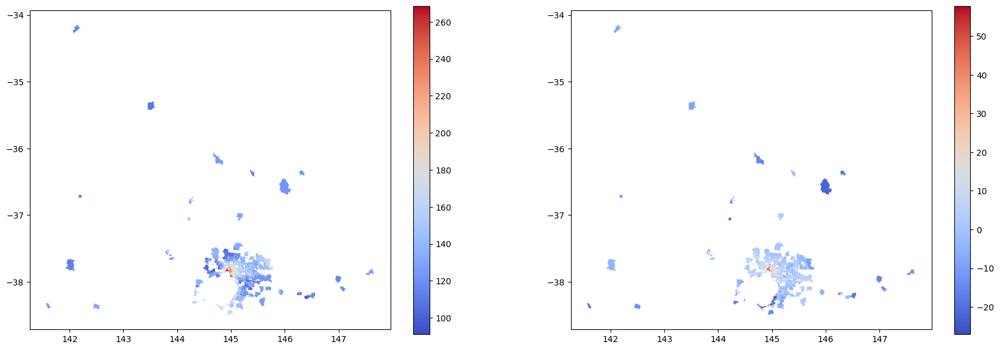

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/578931199.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


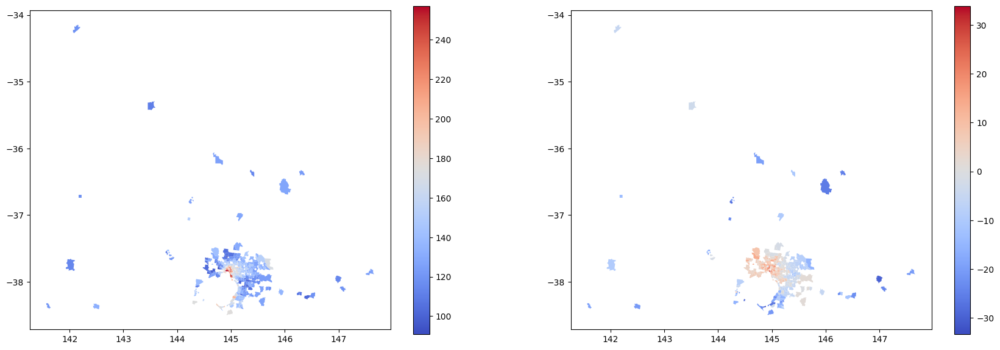

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/578931199.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


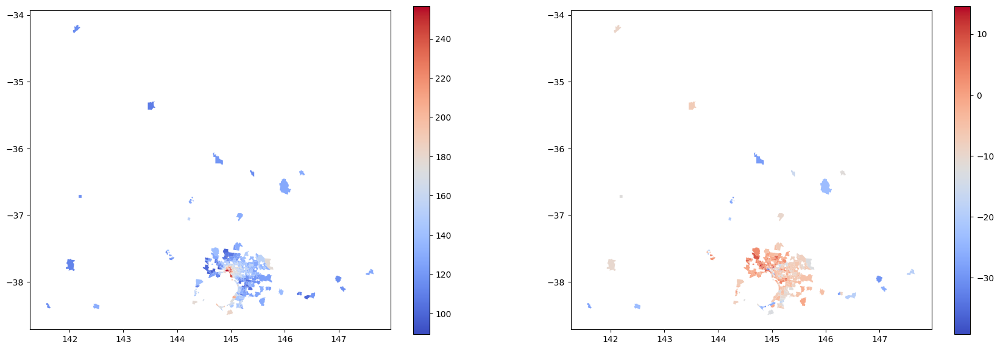

                                  train_years test_year         mse        r2
0                                      [2016]    [2017]   53.277958  0.952052
1                                [2016, 2017]    [2018]   47.377531  0.960222
2                          [2016, 2017, 2018]    [2019]   44.318840  0.964915
3                    [2016, 2017, 2018, 2019]    [2020]   48.107008  0.959162
4              [2016, 2017, 2018, 2019, 2020]    [2021]  149.741184  0.823449
5        [2016, 2017, 2018, 2019, 2020, 2021]    [2022]  115.105575  0.868707
6  [2016, 2017, 2018, 2019, 2020, 2021, 2022]    [2023]   88.147980  0.921073


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/578931199.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


In [418]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Initialize the TimeSeriesSplit with the number of splits equal to the number of years minus one
years = sorted(df['year'].unique())
n_splits = len(years) - 1
tscv = TimeSeriesSplit(n_splits=n_splits)

# Prepare a DataFrame to store the results
results = pd.DataFrame(columns=['train_years', 'test_year', 'mse', 'r2'])

# Iterate through the splits
for train_index, test_index in tscv.split(df):
    train_years = df.iloc[train_index]['year'].unique()
    test_year = df.iloc[test_index]['year'].unique()
    
    # Split the data into training and testing sets
    X_train, X_test = df.iloc[train_index].drop(columns=[target, 'year']), df.iloc[test_index].drop(columns=[target, 'year'])
    y_train, y_test = df.iloc[train_index][target], df.iloc[test_index][target]

    
    # Initialize and train the model
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    SAL_test = df.iloc[test_index]['SAL_CODE']
    
    df_graphing = pd.DataFrame({
        'SAL_CODE': SAL_test,
        'pred': y_pred,
        'actual' : y_test,
        'residuals': y_pred - y_test
    })
    

    fig, axes = plt.subplots(1, 2, figsize=(21, 7))

    generate_plot(axes[0], df_graphing, "pred", )
    generate_plot(axes[1], df_graphing, 'residuals')


    plt.show()
    
    # Store the results
    results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)

# Display the results
print(results)

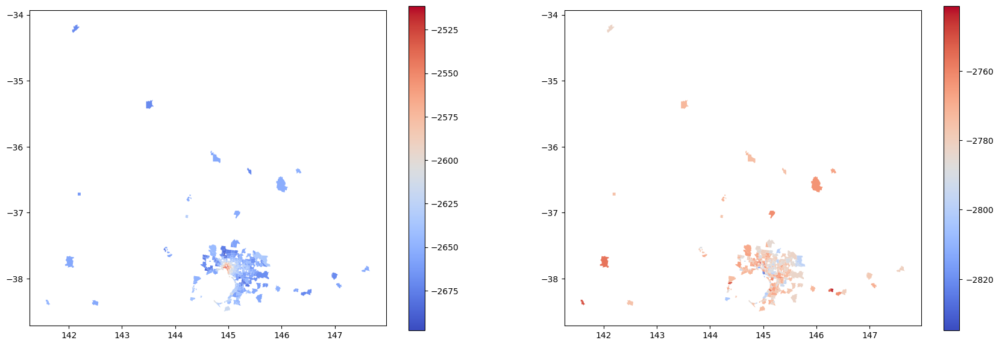

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4239414028.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


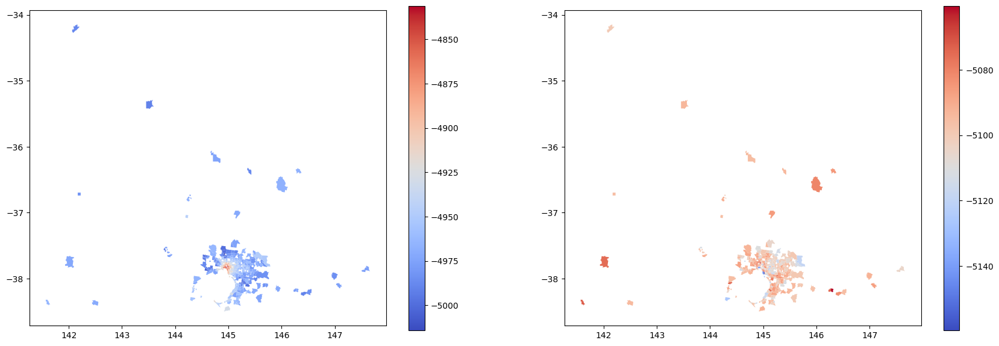

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4239414028.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


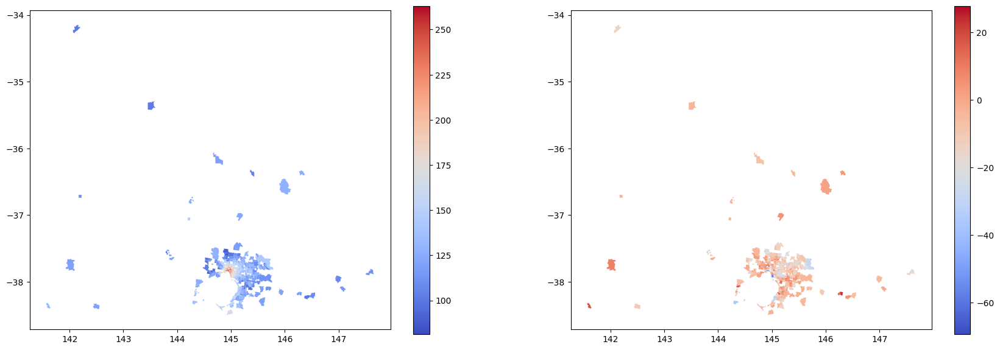

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4239414028.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


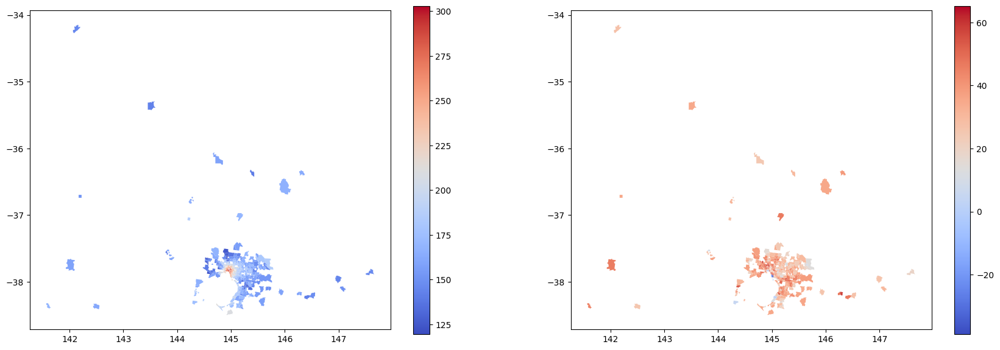

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4239414028.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


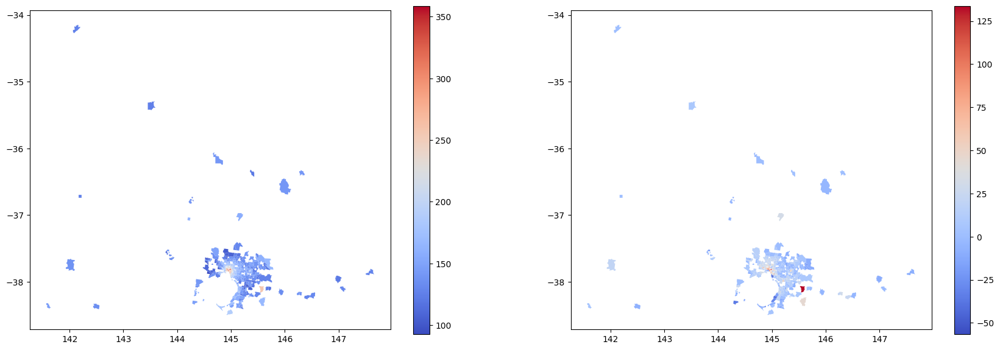

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4239414028.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


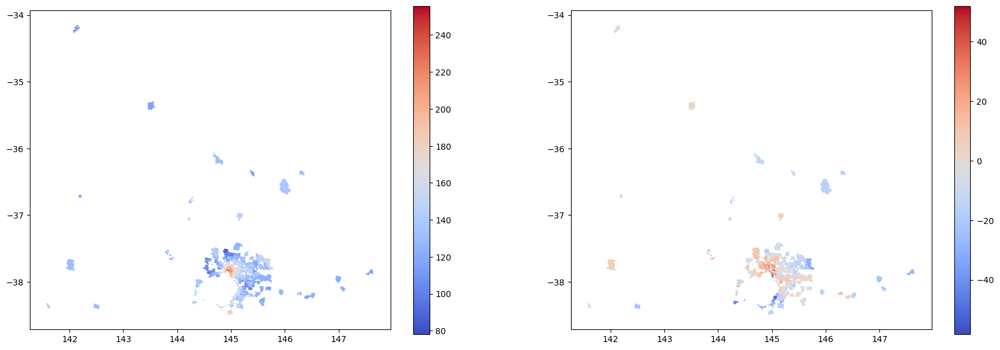

/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4239414028.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


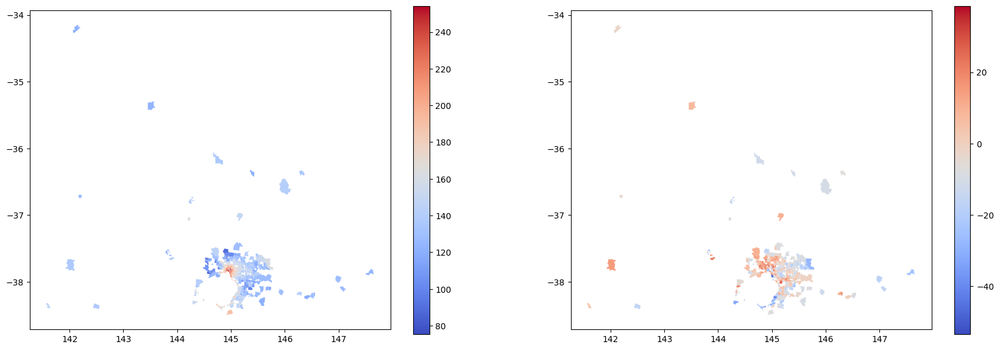

                                  train_years test_year           mse  \
0                                      [2016]    [2017]  7.721540e+06   
1                                [2016, 2017]    [2018]  2.599472e+07   
2                          [2016, 2017, 2018]    [2019]  1.905598e+02   
3                    [2016, 2017, 2018, 2019]    [2020]  1.195694e+03   
4              [2016, 2017, 2018, 2019, 2020]    [2021]  6.384233e+02   
5        [2016, 2017, 2018, 2019, 2020, 2021]    [2022]  2.919685e+02   
6  [2016, 2017, 2018, 2019, 2020, 2021, 2022]    [2023]  2.056332e+02   

             r2  
0  -6948.015077  
1 -21824.319059  
2      0.849145  
3     -0.015018  
4      0.247273  
5      0.666970  
6      0.815879  


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4239414028.py:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)


In [419]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Initialize the TimeSeriesSplit with the number of splits equal to the number of years minus one
years = sorted(df['year'].unique())
n_splits = len(years) - 1
tscv = TimeSeriesSplit(n_splits=n_splits)

# Prepare a DataFrame to store the results
results = pd.DataFrame(columns=['train_years', 'test_year', 'mse', 'r2'])

# Iterate through the splits
for train_index, test_index in tscv.split(df):
    train_years = df.iloc[train_index]['year'].unique()
    test_year = df.iloc[test_index]['year'].unique()
    
    # Split the data into training and testing sets
    X_train, X_test = df.iloc[train_index].drop(columns=[target, 'year']), df.iloc[test_index].drop(columns=[target, 'year'])
    y_train, y_test = df.iloc[train_index][target], df.iloc[test_index][target]

    
    # Initialize and train the model
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    SAL_test = df.iloc[test_index]['SAL_CODE']
    
    df_graphing = pd.DataFrame({
        'SAL_CODE': SAL_test,
        'pred': y_pred,
        'actual' : y_test,
        'residuals': y_pred - y_test
    })
    

    fig, axes = plt.subplots(1, 2, figsize=(21, 7))

    generate_plot(axes[0], df_graphing, "pred", )
    generate_plot(axes[1], df_graphing, 'residuals')


    plt.show()
    
    # Store the results
    results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2}, ignore_index=True)

# Display the results
print(results)

In [420]:
# Get counts per year
year_counts = df['year'].value_counts().sort_index()

# Print the counts
print(year_counts)

2016    429
2017    429
2018    429
2019    429
2020    429
2021    429
2022    429
2023    429
Name: year, dtype: int64


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4102577856.py:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2, 'mean_actual': mean_actual, 'mean_predicted': mean_predicted}, ignore_index=True)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4102577856.py:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2, 'mean_actual': mean_actual, 'mean_predicted': mean_predicted}, ignore_index=True)
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/4102577856.py:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

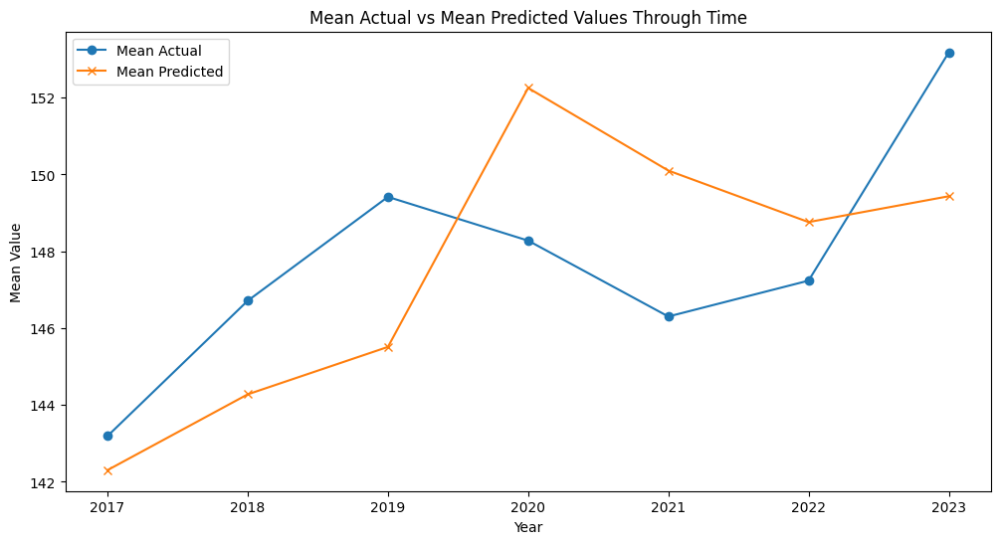

                                  train_years test_year         mse        r2  \
0                                      [2016]      2017   32.890781  0.970400   
1                                [2016, 2017]      2018   35.651297  0.970067   
2                          [2016, 2017, 2018]      2019   47.721524  0.962222   
3                    [2016, 2017, 2018, 2019]      2020   57.939847  0.950815   
4              [2016, 2017, 2018, 2019, 2020]      2021  148.106551  0.825376   
5        [2016, 2017, 2018, 2019, 2020, 2021]      2022  143.394140  0.836440   
6  [2016, 2017, 2018, 2019, 2020, 2021, 2022]      2023  108.717318  0.902656   

   mean_actual  mean_predicted  
0   143.191257      142.303436  
1   146.712888      144.276978  
2   149.417249      145.511017  
3   148.278483      152.252930  
4   146.302687      150.101868  
5   147.236599      148.761185  
6   153.177715      149.433838  


In [421]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score, KFold

# Initialize the TimeSeriesSplit with the number of splits equal to the number of years minus one
years = sorted(df['year'].unique())
n_splits = len(years) - 1
tscv = TimeSeriesSplit(n_splits=n_splits)

# Prepare a DataFrame to store the results
results = pd.DataFrame(columns=['train_years', 'test_year', 'mse', 'r2'])

# Iterate through the splits
for train_index, test_index in tscv.split(df):
    
    train_years = df.iloc[train_index]['year'].unique()
    test_year = df.iloc[test_index]['year'].unique()[0]
    
    # Split the data into training and testing sets
    X_train, X_test = df.iloc[train_index].drop(columns=[target, 'year','SAL_CODE']), df.iloc[test_index].drop(columns=[target, 'year','SAL_CODE'])
    y_train, y_test = df.iloc[train_index][target], df.iloc[test_index][target]
    
    # Initialize and train the model
    model = xgb.XGBRegressor(objective='reg:squarederror')
    model.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Calculate mean actual and mean predicted values
    mean_actual = y_test.mean()
    mean_predicted = y_pred.mean()
    
    # Append the results to the DataFrame
    results = results.append({'train_years': train_years, 'test_year': test_year, 'mse': mse, 'r2': r2, 'mean_actual': mean_actual, 'mean_predicted': mean_predicted}, ignore_index=True)

# Plot mean actual and mean predicted values through time
plt.figure(figsize=(12, 6))
plt.plot(results['test_year'], results['mean_actual'], label='Mean Actual', marker='o')
plt.plot(results['test_year'], results['mean_predicted'], label='Mean Predicted', marker='x')
plt.xlabel('Year')
plt.ylabel('Mean Value')
plt.title('Mean Actual vs Mean Predicted Values Through Time')
plt.legend()
plt.show()

# Display the results
print(results)


In [422]:
# Drop the 'year' column from the dataset
X_no_year = df.drop(columns=[target, 'year','SAL_CODE'])


# Make predictions on the entire dataset
y_pred_xgb_full = model.predict(X_no_year)

# Calculate residuals for the entire dataset
residuals_xgb = y - y_pred_xgb_full

# Display the residuals
residuals_xgb

0       -0.083226
292      0.700499
291     -0.466780
290     -0.659548
289     -0.334103
          ...    
3142    -2.852921
3141    10.017354
3140   -11.861062
3139     2.290636
3149     2.412600
Name: average_weekly_rent/inflation/household_size, Length: 3432, dtype: float64

In [423]:
residuals.shape

(3432,)

In [424]:
# find SAL code of 10 highest residuals
residuals_df = pd.DataFrame({'SAL_CODE': df['SAL_CODE'], 'year': data_train['year'], 'residuals': residuals,'xg_residuals':residuals_xgb, 'average_weekly_rent': df['average_weekly_rent/inflation/household_size']})

residuals_df



,SAL_CODE,year,residuals,xg_residuals,average_weekly_rent
0,20023.0,2016,-2.761924,-0.083226,101.439296
1,20111.0,2016,-3.321557,-0.076790,124.565483
2,20409.0,2016,-0.724659,0.168002,114.562350
3,20730.0,2016,-4.389055,-0.917934,95.974553
4,21783.0,2016,1.543079,1.116338,123.690824
...,...,...,...,...,...
5143,NaN,2028,NaN,NaN,NaN
5144,NaN,2028,NaN,NaN,NaN
5145,NaN,2028,NaN,NaN,NaN
5146,NaN,2028,NaN,NaN,NaN


In [425]:
import geopandas as gpd

In [426]:
# import SAL
sal_code = gpd.read_file("../data/landing/SAL_data/SAL_2021_AUST_GDA2020.shp")

# Drop non-integer SAL_CODE21 values
sal_code = sal_code[sal_code['SAL_CODE21'].apply(lambda x: str(x).isdigit())]
sal_code["SAL_CODE21"] = sal_code["SAL_CODE21"].astype(int)

In [427]:
# residuals_df 
residuals_df = residuals_df.merge(sal_code, right_on='SAL_CODE21', left_on='SAL_CODE')

In [428]:
residuals_df.columns

Index(['SAL_CODE', 'year', 'residuals', 'xg_residuals', 'average_weekly_rent',
       'SAL_CODE21', 'SAL_NAME21', 'STE_CODE21', 'STE_NAME21', 'AUS_CODE21',
       'AUS_NAME21', 'AREASQKM21', 'LOCI_URI21', 'SHAPE_Leng', 'SHAPE_Area',
       'geometry'],
      dtype='object')

In [429]:
from math import radians, cos, sin, asin, sqrt

# for better visualisaiton, remove suburbs too far outside melbourne
# Compute distance to Melbourne CBD
melbourne_cbd_coords = (-37.8136, 144.9631)  # Latitude and Longitude of Melbourne CBD

# Function to calculate distance
def haversine(lat1, lon1, lat2, lon2):
    # convert decimal degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    # haversine formula
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371  # Radius of earth in kilometers
    return c * r

# Apply the function to calculate distance to Melbourne CBD
residuals_df['distance_to_CBD'] = residuals_df.apply(lambda row: haversine(row['geometry'].centroid.y, row['geometry'].centroid.x, melbourne_cbd_coords[0], melbourne_cbd_coords[1]), axis=1)

# Filter out suburbs too far outside Melbourne (e.g., more than 50 km)
residuals_df = residuals_df[residuals_df['distance_to_CBD'] <= 100]

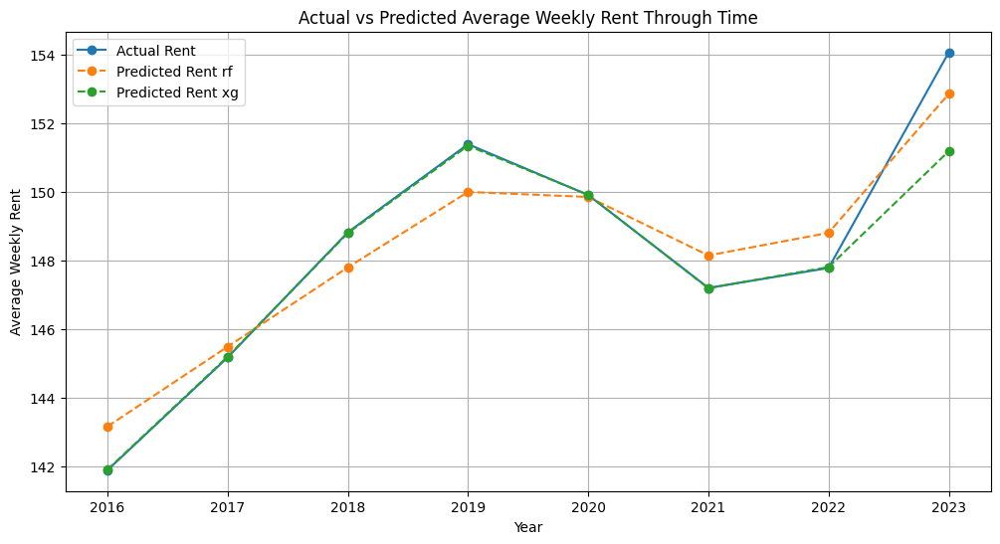

1200

In [430]:
# Calculate the predicted values by subtracting residuals from actual values
residuals_df['predicted_rent'] = residuals_df['average_weekly_rent'] - residuals_df['residuals']
residuals_df['predicted_rent_xg'] = residuals_df['average_weekly_rent'] - residuals_df['xg_residuals']

# Group by year and calculate the mean for actual and predicted rents
mean_rents = residuals_df.groupby('year')[['average_weekly_rent', 'predicted_rent',"predicted_rent_xg"]].mean().reset_index()

# Plot the actual vs predicted rents through time
plt.figure(figsize=(12, 6))
plt.plot(mean_rents['year'], mean_rents['average_weekly_rent'], marker='o', label='Actual Rent')
plt.plot(mean_rents['year'], mean_rents['predicted_rent'], marker='o', label='Predicted Rent rf', linestyle='--')
plt.plot(mean_rents['year'], mean_rents['predicted_rent_xg'], marker='o', label='Predicted Rent xg', linestyle='--')
plt.title('Actual vs Predicted Average Weekly Rent Through Time')
plt.xlabel('Year')
plt.ylabel('Average Weekly Rent')
plt.legend()
plt.grid(True)
plt.show()

150 * 8

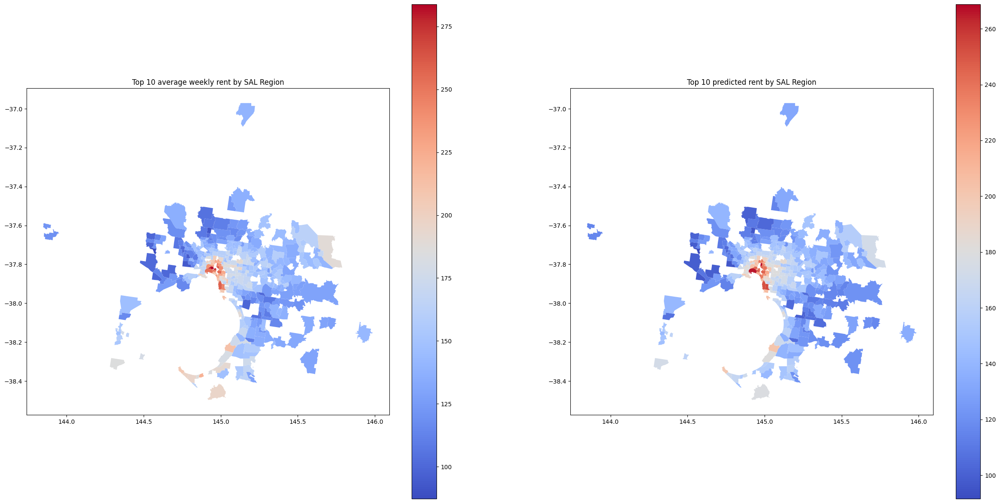

In [431]:

residuals_2023 = residuals_df[residuals_df["year"] == 2023]

# now make gdf

residuals_2023 = gpd.GeoDataFrame(residuals_2023, geometry='geometry')

# graph top 10 residuals
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15))

residuals_2023.plot(column='average_weekly_rent', ax=ax1, legend=True, cmap='coolwarm')
ax1.set_title('Top 10 average weekly rent by SAL Region')

residuals_2023.plot(column='predicted_rent_xg', ax=ax2, legend=True, cmap='coolwarm')
ax2.set_title('Top 10 predicted rent by SAL Region')

plt.show()


In [441]:
# Filter the data for the years 2018 to 2023 (inclusive)
filtered_df = residuals_df[residuals_df['year'].isin(range(2017,2019))]

# Ensure the data is sorted by year within each group for accurate calculations
filtered_df = filtered_df.sort_values(by=['SAL_CODE', 'year'])

# Calculate the growth in average weekly rent over the last 5 years for each suburb
filtered_df['growth_actual'] = filtered_df.groupby('SAL_CODE')['average_weekly_rent'].transform(
    lambda x: (x.iloc[-1] - x.iloc[0]) / x.iloc[0] * 100 if len(x) > 1 else 0
)
filtered_df['growth_predicted'] = filtered_df.groupby('SAL_CODE')['predicted_rent_xg'].transform(
    lambda x: (x.iloc[-1] - x.iloc[0]) / x.iloc[0] * 100 if len(x) > 1 else 0
)

# Drop duplicates to get one entry per suburb
suburb_growth_actual = filtered_df.drop_duplicates(subset='SAL_CODE', keep='last')
suburb_growth_predicted = filtered_df.drop_duplicates(subset='SAL_CODE', keep='last')

# Sort the suburbs by the highest growth in actual and predicted rents
highest_growth_actual = suburb_growth_actual.sort_values(by='growth_actual', ascending=False)
highest_growth_predicted = suburb_growth_predicted.sort_values(by='growth_predicted', ascending=False)

# Display the top suburbs with the highest growth
print("Suburbs with the highest growth in actual average weekly rent over the last 5 years:")
print(highest_growth_actual[['SAL_NAME21', 'growth_actual']][:10])

print("\nSuburbs with the highest growth in predicted average weekly rent over the last 5 years:")
print(highest_growth_predicted[['SAL_NAME21', 'growth_predicted']])


Suburbs with the highest growth in actual average weekly rent over the last 5 years:
             SAL_NAME21  growth_actual
546     Armadale (Vic.)       8.546635
218     Box Hill (Vic.)       7.314161
594           Docklands       6.415036
234      Box Hill South       6.293236
226      Box Hill North       6.293236
1354          Thornbury       6.126911
1594             Keilor       5.839099
322    Glen Iris (Vic.)       5.656876
258   Camberwell (Vic.)       5.626319
1826     Seymour (Vic.)       5.567865

Suburbs with the highest growth in predicted average weekly rent over the last 5 years:
            SAL_NAME21  growth_predicted
546    Armadale (Vic.)          9.277186
226     Box Hill North          7.222398
218    Box Hill (Vic.)          6.843717
594          Docklands          6.735169
1570  Greenvale (Vic.)          6.118334
...                ...               ...
2858     Botanic Ridge         -0.719980
2850       Blind Bight         -1.105703
3034  Junction Village      

In [442]:
highest_growth_predicted[highest_growth_predicted["SAL_NAME21"] == 'Melbourne']

,SAL_CODE,year,residuals,xg_residuals,average_weekly_rent,SAL_CODE21,SAL_NAME21,STE_CODE21,STE_NAME21,AUS_CODE21,...,AREASQKM21,LOCI_URI21,SHAPE_Leng,SHAPE_Area,geometry,distance_to_CBD,predicted_rent,predicted_rent_xg,growth_actual,growth_predicted


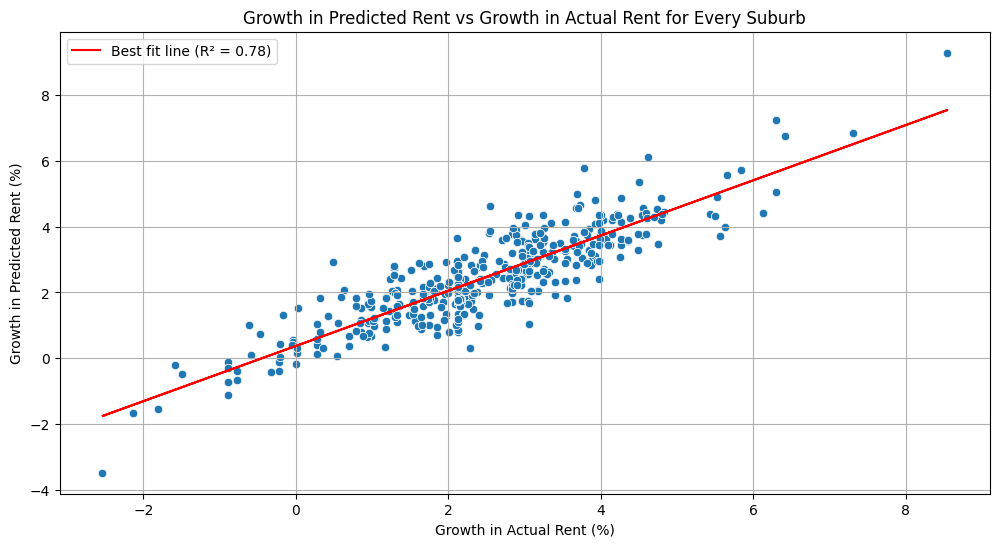

In [443]:
from scipy.stats import linregress

# Scatter plot of growth in predicted rent vs growth in actual rent for every suburb
plt.figure(figsize=(12, 6))
sns.scatterplot(x='growth_actual', y='growth_predicted', data=filtered_df)

# Calculate the line of best fit
slope, intercept, r_value, p_value, std_err = linregress(filtered_df['growth_actual'], filtered_df['growth_predicted'])
line = slope * filtered_df['growth_actual'] + intercept

# Plot the line of best fit
plt.plot(filtered_df['growth_actual'], line, color='red', label=f'Best fit line (R² = {r_value**2:.2f})')

plt.title('Growth in Predicted Rent vs Growth in Actual Rent for Every Suburb')
plt.xlabel('Growth in Actual Rent (%)')
plt.ylabel('Growth in Predicted Rent (%)')
plt.legend()
plt.grid(True)
plt.show()

In [435]:
# compare actual and predicted rents for lg rf 
# Calculate the predicted values by subtracting residuals from actual values
residuals_df['predicted_rent'] = residuals_df['average_weekly_rent'] - residuals_df['residuals']

In [436]:
# find SAL code of 10 highest residuals
top_10_residuals = residuals_df.nlargest(10, 'residuals')[['SAL_CODE21', 'SAL_NAME21', 'residuals', 'year']]
print(top_10_residuals)

      SAL_CODE21        SAL_NAME21  residuals  year
3331       21009       Glen Huntly  28.185999  2019
3332       21009       Glen Huntly  26.320956  2020
3330       21009       Glen Huntly  21.638531  2018
754        22345     St Kilda West  21.575227  2018
755        22345     St Kilda West  21.064407  2019
1726       20162      Barwon Heads  19.924852  2022
863        20788           Dromana  17.845774  2023
1038       22333  St Andrews Beach  16.685282  2022
830        20257       Blairgowrie  16.591319  2022
3329       21009       Glen Huntly  16.558875  2017


In [437]:
# bottom 10 residuals
bottom_10_residuals = residuals_df.nsmallest(10, 'residuals')[['SAL_CODE21', 'SAL_NAME21', 'residuals', 'year']]
print(bottom_10_residuals)


      SAL_CODE21       SAL_NAME21  residuals  year
597        20766        Docklands -21.896091  2021
1190       21246   Ivanhoe (Vic.) -19.472071  2022
3358       21214       Hughesdale -17.265797  2022
382        21393          Kooyong -17.209896  2022
3286       20524  Caulfield South -16.740080  2022
3269       20522   Caulfield East -16.271036  2021
3357       21214       Hughesdale -14.925179  2021
1008       22303           Somers -14.590511  2016
549        20066  Armadale (Vic.) -14.484046  2021
717        22310  South Melbourne -13.706015  2021


In [438]:
import folium
from folium import Choropleth

# Convert GeoDataFrame to GeoJSON
geojson_data = residuals_2023.to_json()

# Create a base map
m = folium.Map(location=[residuals_2023.geometry.centroid.y.mean(),
                         residuals_2023.geometry.centroid.x.mean()],
               zoom_start=10)

# Add the choropleth layer
Choropleth(
    geo_data=geojson_data,
    name='choropleth',
    data=residuals_2023,
    columns=['SAL_NAME21', 'average_weekly_rent'],
    key_on='feature.properties.SAL_NAME21',
    fill_opacity=0.7,
    line_opacity=0.2,
    line_weight=0.3,  # Make lines thinner
    line_color='black',  # Change line color to black
    legend_name='Average Weekly Rent'
).add_to(m)

# Add hover functionality for each SAL region
folium.GeoJson(
    geojson_data,
    tooltip=folium.GeoJsonTooltip(fields=['SAL_NAME21', 'average_weekly_rent'],
                                  aliases=['Suburb:', 'Average Weekly Rent:'],
                                  localize=True)
).add_to(m)

# Display the map
m


/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/3673129997.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[residuals_2023.geometry.centroid.y.mean(),
/var/folders/vs/mmhmvz2124bdlbwz4b6zdqqh0000gn/T/ipykernel_83903/3673129997.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residuals_2023.geometry.centroid.x.mean()],


In [439]:
# find SAL code of 10 highest residuals
top_10_residuals = residuals_2023.nlargest(30, 'average_weekly_rent')[['SAL_NAME21', 'average_weekly_rent', 'year']]
print(top_10_residuals)

              SAL_NAME21  average_weekly_rent  year
599            Docklands           283.806867  2023
735            Southbank           273.256576  2023
607       East Melbourne           259.024463  2023
3239     Brighton (Vic.)           258.923577  2023
727          South Yarra           255.226960  2023
679       Port Melbourne           253.102285  2023
623       Fitzroy (Vic.)           248.072237  2023
719      South Melbourne           246.250570  2023
3247       Brighton East           245.383882  2023
759        St Kilda West           242.148604  2023
591      Cremorne (Vic.)           240.399900  2023
703      Richmond (Vic.)           240.399900  2023
535    Abbotsford (Vic.)           240.070087  2023
695         Princes Hill           238.674508  2023
783       West Melbourne           236.990925  2023
583   Collingwood (Vic.)           234.934898  2023
687              Prahran           232.268090  2023
791       Windsor (Vic.)           232.268090  2023
631        F

In [440]:
sal_to_exclude = pd.read_csv('../data/landing/filtered_sal_codes.csv')
